<font size = 6> Transfer learning with my own dataset using Pytorch

In [1]:
#import the necessary libraries

import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import torchvision
import time
import os
from PIL import Image
from tempfile import TemporaryDirectory

In [2]:
from torch.optim import lr_scheduler
from torchvision import datasets, transforms, models
from torch.backends import cudnn

In [3]:
cudnn.benchmark = True
plt.ion()   # interactive mode

In [7]:
!rm -R "/content/drive/MyDrive/CPE313/PandasBears/Train/.ipynb_checkpoints"
!ls -a "/content/drive/MyDrive/CPE313/PandasBears/Train"

!rm -R "/content/drive/MyDrive/CPE313/PandasBears/Test/.ipynb_checkpoints"
!ls -a "/content/drive/MyDrive/CPE313/PandasBears/Test"


rm: cannot remove '/content/drive/MyDrive/CPE313/PandasBears/Train/.ipynb_checkpoints': No such file or directory
Bears  Pandas
rm: cannot remove '/content/drive/MyDrive/CPE313/PandasBears/Test/.ipynb_checkpoints': No such file or directory
Bears  Pandas


<b>Data augmentation and normalization for training

In [17]:
# Lets create a data tranformer
# This is really important when we are importing image to help our model analyze our image more efficient

# It is in the dictionary form since we have 2 sub folder in our main directory
# which are train and validation set

# this is the necessary librart for this part
from torchvision import transforms

data_transforms = {
    # for the train
    'Train' : transforms.Compose([
        transforms.RandomResizedCrop(300), # random crop for more datset since our dataset is contains only few images
        transforms.RandomHorizontalFlip(), # horizontal is the only flip we can do, we cant use vertical flip since our image are animals
        transforms.ToTensor(), # turn our dataset into onehot encoding
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]) # this can be vary depending on the model that you are going to use alway look for the documentation
    ]),

    'Test' : transforms.Compose([
        transforms.Resize(350),
        transforms.CenterCrop(300),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
}

<b>Import the dataset

In [18]:
data_dir = '/content/drive/MyDrive/CPE313/PandasBears'

image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),data_transforms[x]) for x in ['Train', 'Test']} # import the image from the google drive and apply loaders
data_loaders = {x: torch.utils.data.DataLoader(image_datasets[x],batch_size=4, shuffle=True, num_workers=4) for x in ['Train', 'Test']} # apply shuffling in to the dataset

In [19]:
device = torch.accelerator.current_accelerator().type if torch.accelerator.is_available() else "cpu"
print(f"Using {device} device")

Using cuda device


<b> Visualizing the datset

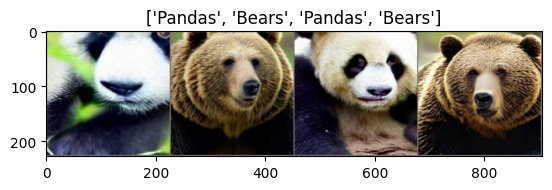

In [21]:
def imshow(inp, title=None):
    """Display image for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['Train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

# <font size = 6> Creating a training model function

In [103]:
# for this part I will create my own training function with save results so we can graph it
import copy

def train_model_with_plots(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    # lets create a dictionary where the results of accuracy and loss in both training and validation mode is save
    history = {'train_acc': [], 'val_acc': [], 'train_loss': [], 'val_loss': []}

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        for phase in ['Train', 'Test']:
            if phase == 'Train':
                model.train() # set the model to training mode
            else:
                model.eval() # set the model to validation/evaluation mode

            running_loss = 0.0
            running_corrects = 0


            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)


                # zero the parameter gradients this is necessary always empty the gradients after feedforward
                optimizer.zero_grad()


                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'Train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == 'Train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            # append every results into the dictionary
            if phase == 'Train':
                history['train_acc'].append(epoch_acc.item())
                history['train_loss'].append(epoch_loss)
            elif phase == 'Test':
                history['val_acc'].append(epoch_acc.item())
                history['val_loss'].append(epoch_loss)

            # deep copy the model
            if phase == 'Test' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
        # print the results of every epochs
        print()

    # save the time
    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:4f}')

    # load best model weights
    model.load_state_dict(best_model_wts)

    # return the model and the result dictionary
    return model, history

In [101]:
def plot_history(history):
    epochs = range(1, len(history['train_acc']) + 1)

    fig = plt.figure(figsize=(12, 6))
    ax = fig.add_subplot(1, 2, 1)
    # plot the accuracy
    ax.plot(epochs, history['train_acc'], 'b-x', label='Training Accuracy')
    ax.plot(epochs, history['val_acc'], 'r-x', label='Validation Accuracy')
    ax.legend()
    ax.set_title('Accuracy Train vs Validation')
    ax.grid(True)
    # Plot the Loss function


    ax = fig.add_subplot(1, 2, 2)
    ax.plot(epochs, history['train_loss'], 'b-x', label='Training Loss')
    ax.plot(epochs, history['val_loss'], 'r-x', label='Validation Loss')
    ax.legend()
    ax.set_title('Accuracy Train vs Validation')
    ax.grid(True)



    # Show the plot
    plt.tight_layout()
    plt.show()

<b> using Resnet 18</b>
- For this time I will start first with small model before we move to large models for this problem.

In [104]:
model_ft = models.resnet18(weights='IMAGENET1K_V1')
num_ftrs = model_ft.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to ``nn.Linear(num_ftrs, len(class_names))``.
model_ft.fc = nn.Linear(num_ftrs, 2)

model_ft = model_ft.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

In [105]:
model_ft, history_R18 = train_model_with_plots(model_ft, criterion, optimizer_ft, exp_lr_scheduler,
                       num_epochs=25)

Epoch 0/24
----------


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:432: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()


Train Loss: 0.2723 Acc: 0.8860
Test Loss: 0.0019 Acc: 1.0000

Epoch 1/24
----------
Train Loss: 0.2869 Acc: 0.8960
Test Loss: 0.0037 Acc: 1.0000

Epoch 2/24
----------
Train Loss: 0.2577 Acc: 0.9220
Test Loss: 0.0004 Acc: 1.0000

Epoch 3/24
----------
Train Loss: 0.1818 Acc: 0.9480
Test Loss: 0.0013 Acc: 1.0000

Epoch 4/24
----------
Train Loss: 0.3858 Acc: 0.8900
Test Loss: 0.0055 Acc: 1.0000

Epoch 5/24
----------
Train Loss: 0.1748 Acc: 0.9420
Test Loss: 0.0005 Acc: 1.0000

Epoch 6/24
----------
Train Loss: 0.2391 Acc: 0.9320
Test Loss: 0.0003 Acc: 1.0000

Epoch 7/24
----------
Train Loss: 0.1914 Acc: 0.9460
Test Loss: 0.0003 Acc: 1.0000

Epoch 8/24
----------
Train Loss: 0.1624 Acc: 0.9500
Test Loss: 0.0001 Acc: 1.0000

Epoch 9/24
----------
Train Loss: 0.2547 Acc: 0.9280
Test Loss: 0.0025 Acc: 1.0000

Epoch 10/24
----------
Train Loss: 0.2177 Acc: 0.9080
Test Loss: 0.0001 Acc: 1.0000

Epoch 11/24
----------
Train Loss: 0.2013 Acc: 0.9380
Test Loss: 0.0036 Acc: 1.0000

Epoch 12/24


<b>Plot the model results

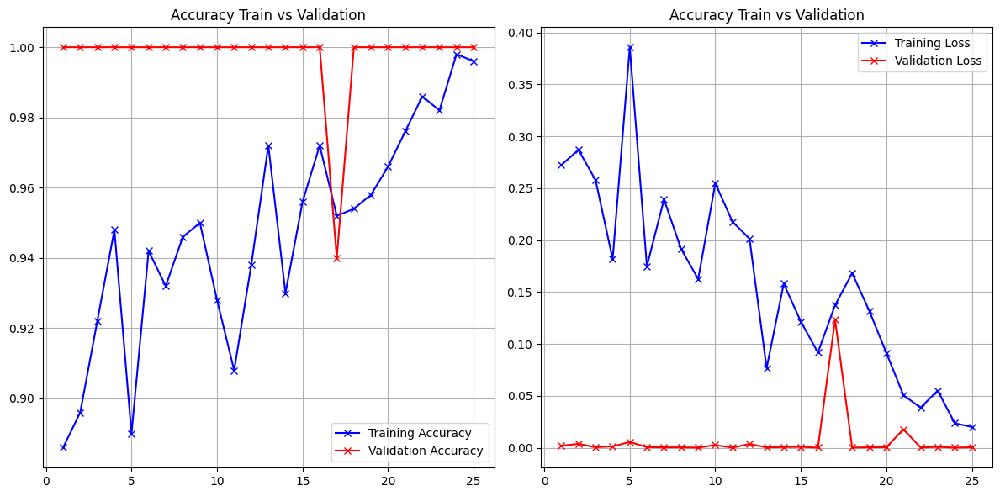

In [106]:
plot_history(history_R18)

<b>Observation</b>
- Base on the result of the model, it performs very well in the datset. Wherein, we are able to receive a 100% accuracy score in the validation set. At first, I think the model is overfitting but base ont the result of the model training, the training accuracy constantly increases directly proportional to the number of epoch until reach an almost same accuracy as the validation accuracy. same scenario is observed in the Loss function plotting.

# <font size = 6> Creating a prediction visualization functions

In [76]:
def imshow(inp, ax=None, title=None):
    """
    Display a PyTorch tensor as an image.
    """
    if inp.is_cuda:
        inp = inp.cpu()

    inp = inp.numpy().transpose((1, 2, 0))

    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)

    if ax is None:
        ax = plt.gca()

    ax.imshow(inp)
    if title:
        ax.set_title(title)
    ax.axis('off')

In [80]:
# lets create our own data visualizing function
# where we are able to show multiple grids
import math
def visualize_model(model, num_images=6, cols=3):
    was_training = model.training
    model.eval()

    rows = math.ceil(num_images / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))


    if num_images == 1:
        axes = np.array([axes])

    axes = axes.flatten()
    images_so_far = 0

    with torch.no_grad():
        for inputs, labels in dataloaders['Test']:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size(0)):
                if images_so_far >= num_images:
                    model.train(mode=was_training)
                    plt.tight_layout()
                    plt.show()
                    return

                ax = axes[images_so_far]

                imshow(inputs[j].cpu(), ax=ax, title=f'Predicted: {class_names[preds[j]]}')
                images_so_far += 1


    for k in range(images_so_far, len(axes)):
        axes[k].axis('off')

    model.train(mode=was_training)
    plt.tight_layout()
    plt.show()

# <font size= 6> Visualizing Model Predictions

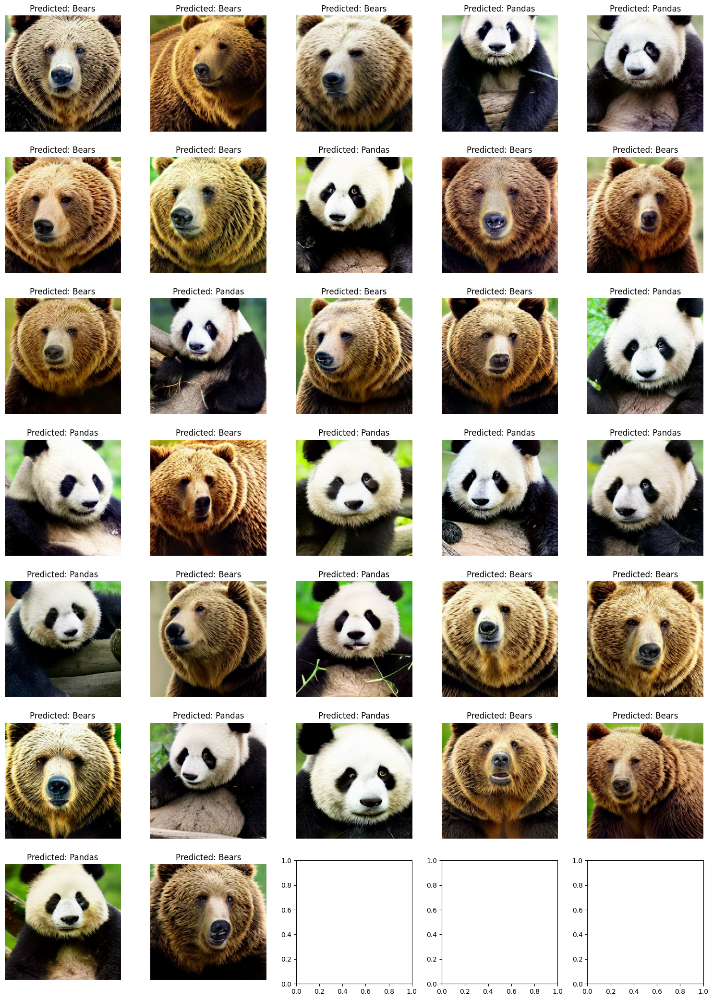

In [82]:
visualize_model(model_ft, 32, 5)

<b>Observation</b>
- Even if we visualize the predictions result, we can observe that the model accurately predict all the validation set.

# <font size = 6>Do We Have a data leak?

<b> to check if the model is able to classify unseen data, lets get a image from google

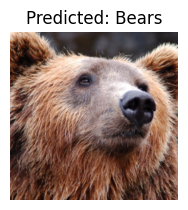

In [34]:
visualize_model_predictions(
    model_ft,
    img_path='/content/drive/MyDrive/CPE313/PandasBears/sampledata_to_test.png'
)

plt.ioff()
plt.show()

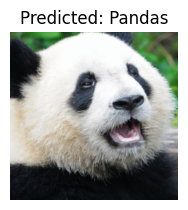

In [35]:
visualize_model_predictions(
    model_ft,
    img_path='/content/drive/MyDrive/CPE313/PandasBears/is_it_pandas_letsee.png'
)

plt.ioff()
plt.show()

<b>Observation:</b>

 - We cant further enhance the pretrained model using the ConvNet, I think lets try another pretrained model

# <font size = 6> Using efficientnet_b7

In [ ]:
model_ft = models.resnet18(weights='IMAGENET1K_V1')
num_ftrs = model_ft.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to ``nn.Linear(num_ftrs, len(class_names))``.
model_ft.fc = nn.Linear(num_ftrs, 2)

model_ft = model_ft.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

In [97]:
model_FNet = models.efficientnet_b7(weights='IMAGENET1K_V1')
num_features = model_FNet.features

model_FNet = model_ft.to(device)

criterion = nn.CrossEntropyLoss()

optimizer_FNet = optim.SGD(model_FNet.parameters(), lr = 0.001)

exp_lr_scheduler = lr_scheduler.StepLR(optimizer_FNet,step_size=7, gamma=0.1)

In [98]:
# lets train the model
model_FNet_trained, history_FNet = train_model_with_plots(model_FNet, criterion, optimizer_FNet, exp_lr_scheduler)

Epoch 0/24
----------
Train Loss: 0.1636 Acc: 0.9260
Test Loss: 0.0020 Acc: 1.0000

Epoch 1/24
----------
Train Loss: 0.1861 Acc: 0.9120
Test Loss: 0.0022 Acc: 1.0000

Epoch 2/24
----------
Train Loss: 0.1267 Acc: 0.9420
Test Loss: 0.0021 Acc: 1.0000

Epoch 3/24
----------
Train Loss: 0.1346 Acc: 0.9480
Test Loss: 0.0019 Acc: 1.0000

Epoch 4/24
----------
Train Loss: 0.1236 Acc: 0.9280
Test Loss: 0.0020 Acc: 1.0000

Epoch 5/24
----------
Train Loss: 0.1835 Acc: 0.9060
Test Loss: 0.0025 Acc: 1.0000

Epoch 6/24
----------
Train Loss: 0.1698 Acc: 0.9160
Test Loss: 0.0022 Acc: 1.0000

Epoch 7/24
----------
Train Loss: 0.2176 Acc: 0.8940
Test Loss: 0.0022 Acc: 1.0000

Epoch 8/24
----------
Train Loss: 0.1290 Acc: 0.9360
Test Loss: 0.0024 Acc: 1.0000

Epoch 9/24
----------
Train Loss: 0.1263 Acc: 0.9280
Test Loss: 0.0030 Acc: 1.0000

Epoch 10/24
----------
Train Loss: 0.1013 Acc: 0.9600
Test Loss: 0.0036 Acc: 1.0000

Epoch 11/24
----------
Train Loss: 0.1437 Acc: 0.9320
Test Loss: 0.0016 Acc

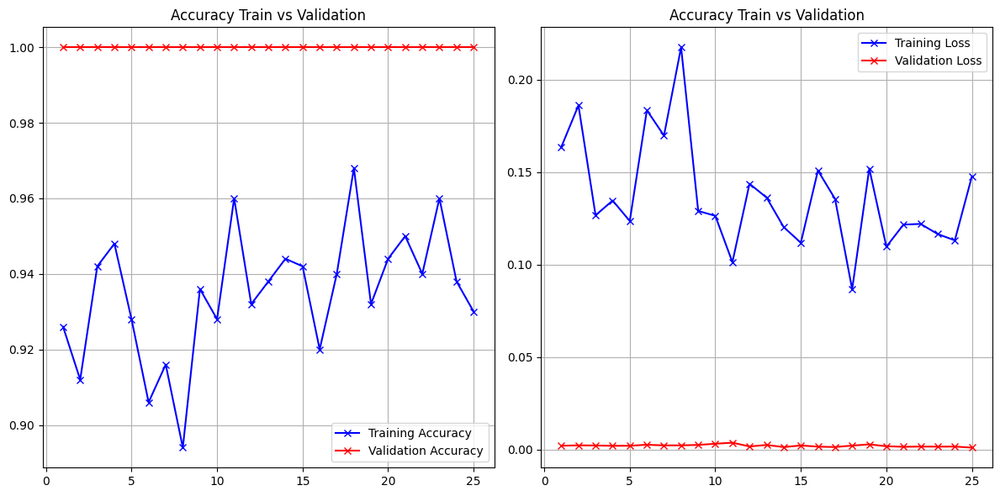

In [102]:
plot_history(history_FNet)

<b>Observation</b>
- If we are going to observe the plotting result of the history during its training. We are able to obtain a same result of 100% accuracy in the validation set. However, the plotting of accuracy of the efficient net in the training has more fluctuations compared to the Resnet18. Same fluctuations will be observe to the Training Loss of the model.

# <font size =6> Visualizing the model of EfficientNet

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:432: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()


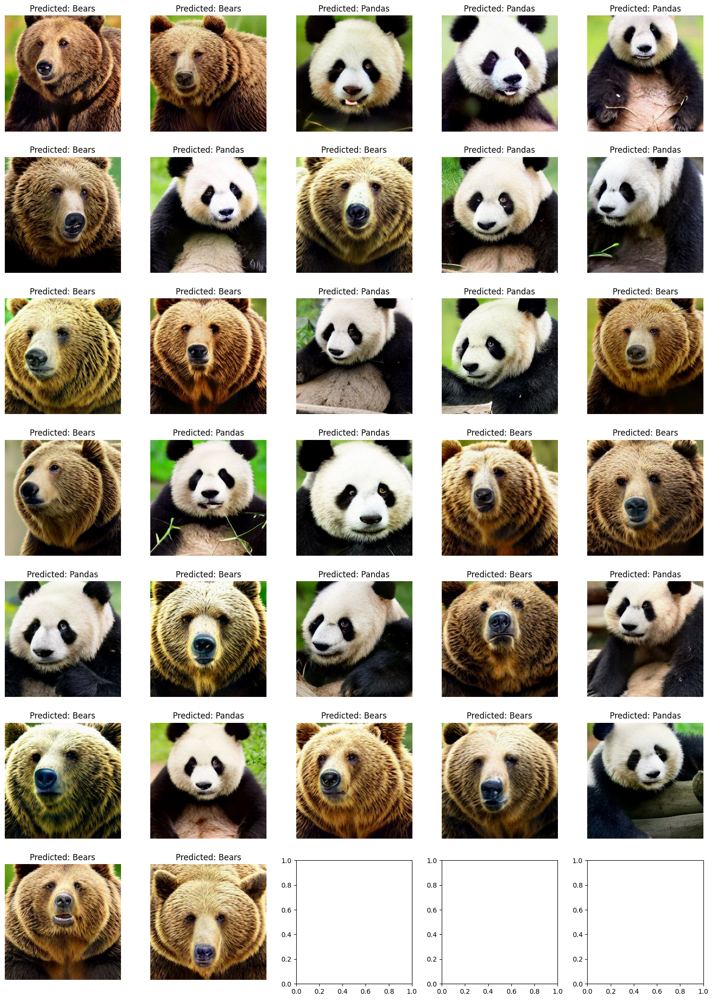

In [107]:
visualize_model(model_FNet, 32, 5)

<b>Observation</b>
- Even if we visualize the predictions result, we can observe that the model accurately predict all the validation set.

# <font size = 6>Conclusion

After completing the activity, I was able to learn how to create and adapt to the workflow of training pretrained model in pytorch. Wherein, I was able to train a pretrained model from the pytorch such as Resnet18 and EfficientNetb7 using my own dataset. Base on the result, I really thought that the model was overfitting but when I created my own training function with graphs in accuracy and loss in both training and validation mode. I was able to realize that the dataset is really easy for the model to analyze. Furthermore, to verify that the model is not overfitting I use a image from the google and predict its class using the created model. Fortunately, It was able to classify its class. Overall, I really enjoy the activity because I was able to create my own workflow in the pytorch. Also, I'm still having difficulty in creating the training function. I think I will try to use another dataset and create a model from scratch using pytorch to fully understand it.